# Homebuyers Guide to the Texas Market!!! Where should you end up?
---
## Analysis Summary: 
### As part of this activity, “hotspots” in Texas is determined based on housing prices, COVID surveillance and public safety.

**-- Main Questions: --**
* Housing Price: Where are housing prices rising the most in the past 6 years? Where have prices fallen? AKA where do you want to stay away from in your home investment? 
* COVID surveillance: Does the place have higher COVID transmission rate?
* Public safety: Is the place safe to live in? What is the crime ranking?

**-- Data Analysis --** Data set for each question was identified, cleaned and a detailed summary analysis were performed. 

**-- Livability Score --** Based on the Data Analysis, from 1 to 5 with 1 being lowest and 5 being highest(best) is determined for each of these categories and overall livability grade based on the mean value of these scores is determined for each county

**-- A visualization map --** created for Texas by each county with a hover that display overall livability Grade, County Name, Avg housing price and Percent Change, Covid (Percent Change), Temperature (Avg Temp), Safety (precent Change)

**-- Compute Linear Regression for Each Relationship --** Computed the linear regression for each relationship and created series of scatter plots and including the model's formula, and the r values in each plot<br>
 * Housing Percent Change vs COVID Percent Change 
 * Housing Percent Change vs Safety Percent Change 
 * COVID Percent Change vs. Safety Percent Change

---
## Written Report: 
**-- Based on Housing Price Analysis: --** Details on the observation

**-- Based on COVID Analysis: --** Details on the observation

**-- Based on Safety Analysis: --** Details on the observation

**-- Based on the Linear Regression and correlation Analysis --**
Based on the linear regression and correlation analysis it is evident that the below relation has very low r value (<0.0). All these relations have weaker correlations. This may be due to dataset limitations.
 * Housing Percent Change vs COVID Percent Change 
 * Housing Percent Change vs COVID Spread Change within counties
 * Housing Percent Change vs Safety Percent Change
 * COVID Percent Change vs. Safety Percent Change
 * COVID Percent Change vs. Safety Percent Change

---
### Limitations


## Dependencies and Setup

In [1]:
# import required libiraries/packages
import pandas as pd
import matplotlib.pyplot as plt
import hvplot.pandas
import geopandas as gpd
from scipy.stats import linregress

In [4]:
# Import datasets csv files -  Liviablity Indexed Datasets from each of the Analysis
COVID_DATAF = pd.read_csv("output/LIndexForCOVID.csv")
SAFTEY_DATADF = pd.read_csv("output/safety_analysis.csv")

HOUSING_DATADF = pd.read_csv("output/housing_price_score.csv")
# Based on Analysis column header and one CountyName column needs update. Formatting Datasheet matching to other outputfiles
HOUSING_DATADF.rename({'CountyName':'COUNTY','Housing Value % Change': 'HOUSING_PCT_CHNG','Housing Score': 'HOUSING_LINDEX'}, axis = "columns", inplace = True) 
HOUSING_DATADF.loc[HOUSING_DATADF[HOUSING_DATADF['COUNTY']=='De Witt'].index.values,['COUNTY']] = "DeWitt"

# Merge all columns 
HomeBuyerGuideDF = pd.merge((pd.merge(COVID_DATAF,HOUSING_DATADF,how='outer', on="COUNTY")),SAFTEY_DATADF,how='outer',on="COUNTY")
HomeBuyerGuideDF = HomeBuyerGuideDF.fillna(0)

# Display Dataframe
HomeBuyerGuideDF


,COUNTY,AVG_COVID_COUNT,AVG_COVID_PERCENT,COVID_SPREAD_PCT,COVID_LINDEX,2017 % Housing Change,2018 % Housing Change,2019 % Housing Change,2020 % Housing Change,2021 % Housing Change,2022 % Housing Change,HOUSING_PCT_CHNG,Current Housing Value,HOUSING_LINDEX,AVG_OFFENCE_COUNT,Offense Count,OFFENSE_PCT,SAFTEY_LINDEX
0,Anderson,202.916667,25.722118,-47.622028,3,0.015321,0.026635,0.072334,0.101193,0.175890,0.112700,0.621855,175981.441989,3.0,43.0,128.0,0.202078,2
1,Andrews,74.500000,9.443767,93.114754,4,-0.001802,0.053630,0.123243,0.061747,0.066292,-0.024441,0.321051,198874.467062,1.0,16.0,48.0,0.075779,3
2,Angelina,267.000000,33.845448,-37.854251,3,0.012616,0.021743,0.135287,0.085698,0.158220,0.000645,0.505089,161055.551233,2.0,114.0,341.0,0.538347,2
3,Aransas,147.750000,18.729082,21.763602,3,0.032459,0.034495,0.065238,0.109672,0.178124,0.091454,0.608920,286760.479386,3.0,18.0,53.0,0.083673,3
4,Archer,70.083333,8.883902,48.449040,4,-0.001726,0.094549,0.048471,0.114011,0.112665,0.082778,0.569620,144530.051053,3.0,4.0,10.0,0.015787,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249,Wood,167.041667,21.174532,-9.729473,3,0.034668,0.081318,0.087942,0.140733,0.267475,0.041424,0.854625,253383.025025,5.0,40.0,120.0,0.189448,2
250,Yoakum,18.916667,2.397914,448.571429,4,0.028115,0.043432,0.116922,0.163150,0.098536,-0.047164,0.517887,150118.516174,2.0,4.0,8.0,0.012630,4
251,Young,99.208333,12.575845,-25.950292,3,-0.005519,0.045015,0.069064,0.122128,0.192257,0.135428,0.640531,137071.653349,3.0,18.0,54.0,0.085251,3
252,Zapata,56.208333,7.125080,2.248876,4,0.032353,-0.035046,0.068914,0.065106,0.038472,-0.044935,0.216468,96680.301905,1.0,2.0,4.0,0.006315,5


#### Livability Grade and Texas map visuvalization

In [5]:
# Calculate Overall livability Index
HomeBuyerGuideDF["LIVABILITY_GRADE"] = HomeBuyerGuideDF[['HOUSING_LINDEX','COVID_LINDEX','SAFTEY_LINDEX']].mean(axis=1)

#  Display texas map by counties with a hover that display overall Liablity Grade , CountyName, Avg housing price and Percent Change, Covid (Percent Change), Temprature(Avg Temp), Saftey (precent Change)

# Read the texas counties list, merge with HomeBuyersGuideDF and create dataframe for texas Map hvplot
SHAPEFILE = 'Resources/tufts-txcounties10-shapefile/GISPORTAL_GISOWNER01_TXCOUNTIES10.shp'
Texas_Lat_Lng = gpd.read_file(SHAPEFILE)[['NAME10', 'INTPTLAT10','INTPTLON10','geometry']]
Texas_Lat_Lng.columns = ['COUNTY','LAT','LNG','geometry']
HomeBuyersGuideDF_Map = pd.merge(Texas_Lat_Lng, HomeBuyerGuideDF, on='COUNTY')

# Display texas map with all required hover information
HomeBuyersGuideDF_Map.hvplot(c='LIVABILITY_GRADE',                                            
                             frame_width=600, frame_height=500, 
                             geo=True, color= 'LIVABILITY_GRADE', cmap='RdYlGn',
                             hover_cols=['COUNTY','LIVABILITY_GRADE', 'HOUSING_PCT_CHNG','COVID_PCT_CHNG','OFFENSE_PCT'], xaxis=None, yaxis=None)

:Polygons   [Longitude,Latitude]   (LIVABILITY_GRADE,COUNTY,HOUSING_PCT_CHNG,OFFENSE_PCT)

#### Compute Linear Regression for Each Relationship 

In [16]:
# Define a resuable function to create Linear Regression plots
def CreatelinregresswithHousingPrice(dataFrame,xais_ColName, yaxis_colName):

    # Calculate the linear regression model 
    (slope, intercept, rvalue, pvalue, stderr) = linregress(dataFrame[xais_ColName], 
                                                            dataFrame[yaxis_colName])
    # Get regression values
    regress_values = dataFrame[xais_ColName] * slope + intercept

    # Create line equation string
    line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))

    # Generating scatter plot
    plt.scatter(dataFrame[xais_ColName], dataFrame[yaxis_colName], s=40,edgecolors='black',alpha=.85)
    plt.plot(dataFrame[xais_ColName],regress_values,"r-")

    #-- Set axis lable for the scatter plot
    plt.xlabel(xais_ColName)
    plt.ylabel(yaxis_colName)

    # annotate the line equation
    # For clear visiblity model's formula is displayed at the left top corner of the plot
    plt.annotate(line_eq,xy=(0, 1), xycoords='figure fraction',fontsize=15,color="red")

    # Print r value
    print(f"The r-value is: {rvalue**2}")

The r-value is: 0.08466514172012445


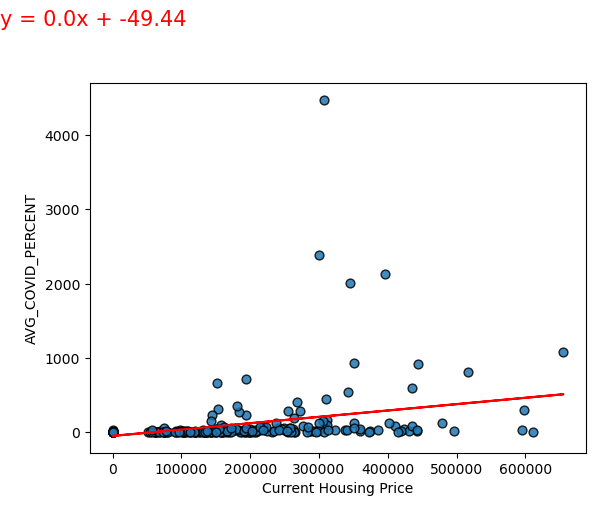

In [8]:
# Linear regression for Housing Percent Change vs  COVID Percent Change
CreatelinregresswithHousingPrice(HomeBuyerGuideDF,'Current Housing Value','AVG_COVID_PERCENT')

The r-value is: 0.0007573697422131211


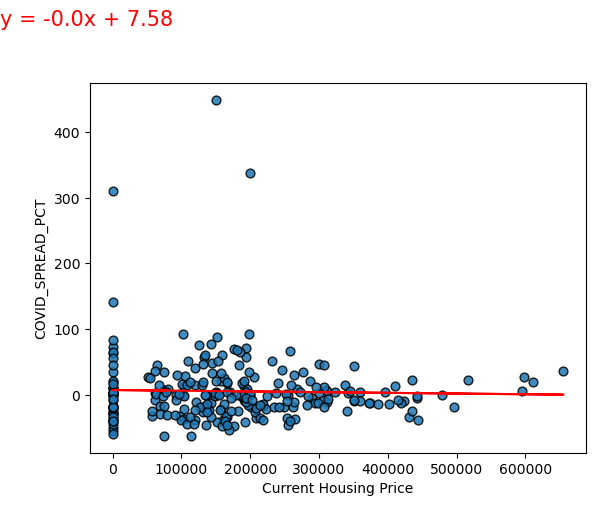

In [14]:
# Linear regression for Housing Percent Change vs  COVID SPREAD VARIANCE byCOUNTY
CreatelinregresswithHousingPrice(HomeBuyerGuideDF,'Current Housing Value','COVID_SPREAD_PCT')

The r-value is: 0.08474586562127649


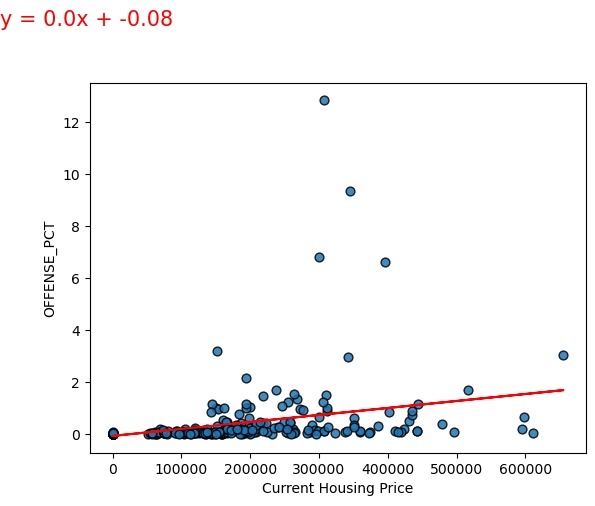

In [13]:
# Linear regression for Housing Percent Change vs  SAFTEY Percent Change
CreatelinregresswithHousingPrice(HomeBuyerGuideDF,'Current Housing Value','OFFENSE_PCT')

The r-value is: 0.002546235213753822


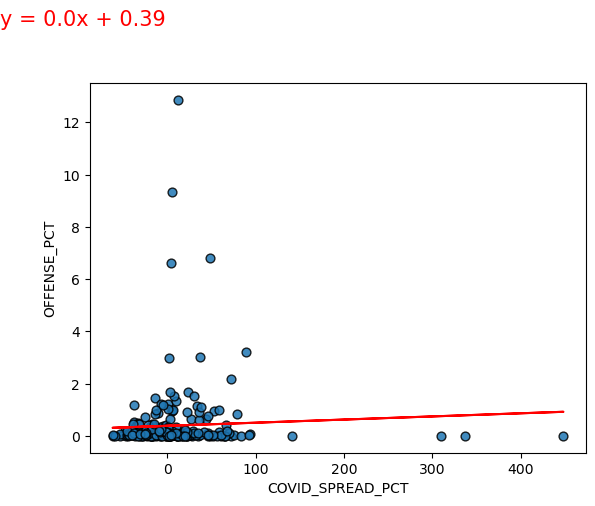

In [17]:
# Linear regression for Covid Spread Change vs  SAFTEY Percent Change
CreatelinregresswithHousingPrice(HomeBuyerGuideDF,'COVID_SPREAD_PCT','OFFENSE_PCT')

The r-value is: 0.9053086438506266


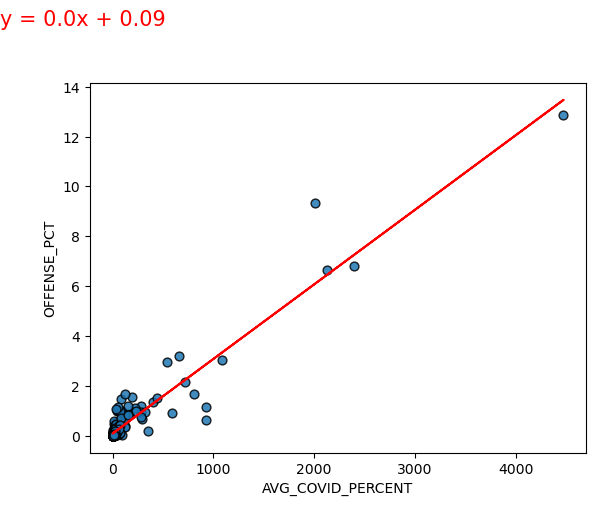

In [18]:
# Linear regression for Covid Percent Change vs  SAFTEY Percent Change
CreatelinregresswithHousingPrice(HomeBuyerGuideDF,'AVG_COVID_PERCENT','OFFENSE_PCT')